# Large Scale Structure Survey

You can find more detail here: https://nbodykit.readthedocs.io/en/latest/cookbook/boss-dr12-data.html

In [1]:
import nbodykit
from nbodykit.lab import *
import numpy as np
import os
import matplotlib.pyplot as plt

In [2]:
download_dir = '../Data/'
data_path = os.path.join(download_dir, 'galaxy_DR12v5_LOWZ_South.fits')
randoms_path = os.path.join(download_dir, 'random0_DR12v5_LOWZ_South.fits')

# initialize the FITS catalog objects for data and randoms
data = FITSCatalog(data_path)
randoms = FITSCatalog(randoms_path)

In [3]:
print(data.columns)

['AIRMASS', 'CAMCOL', 'COMP', 'DEC', 'DEVFLUX', 'EB_MINUS_V', 'EXPFLUX', 'EXTINCTION', 'FIBER2FLUX', 'FIBERID', 'FIELD', 'FINALN', 'FRACPSF', 'ICHUNK', 'ICOLLIDED', 'ID', 'IMAGE_DEPTH', 'IMATCH', 'INGROUP', 'IPOLY', 'ISECT', 'MJD', 'MODELFLUX', 'MULTGROUP', 'NZ', 'PLATE', 'PSFFLUX', 'PSF_FWHM', 'RA', 'RERUN', 'RUN', 'R_DEV', 'SKYFLUX', 'SPECTILE', 'Selection', 'TILE', 'Value', 'WEIGHT_CP', 'WEIGHT_FKP', 'WEIGHT_NOZ', 'WEIGHT_SEEING', 'WEIGHT_STAR', 'WEIGHT_SYSTOT', 'Weight', 'Z']


In [4]:
# the fiducial BOSS DR12 cosmology
cosmo = cosmology.Cosmology(h=0.676).match(Omega0_m=0.31)

# add Cartesian position column
data['Position'] = transform.SkyToCartesian(data['RA'], data['DEC'], data['Z'], cosmo=cosmo)
randoms['Position'] = transform.SkyToCartesian(randoms['RA'], randoms['DEC'], randoms['Z'], cosmo=cosmo)

In [5]:
num = 100000
pos = data['Position'][:num]
#n = 10000
#ra = np.array(data['RA'][:n])*np.pi/180
#dec = data['DEC'][:n]
#redshift = np.array(data['Z'][:n])

x=pos[:,0]
y=pos[:,1]
z=pos[:,2]


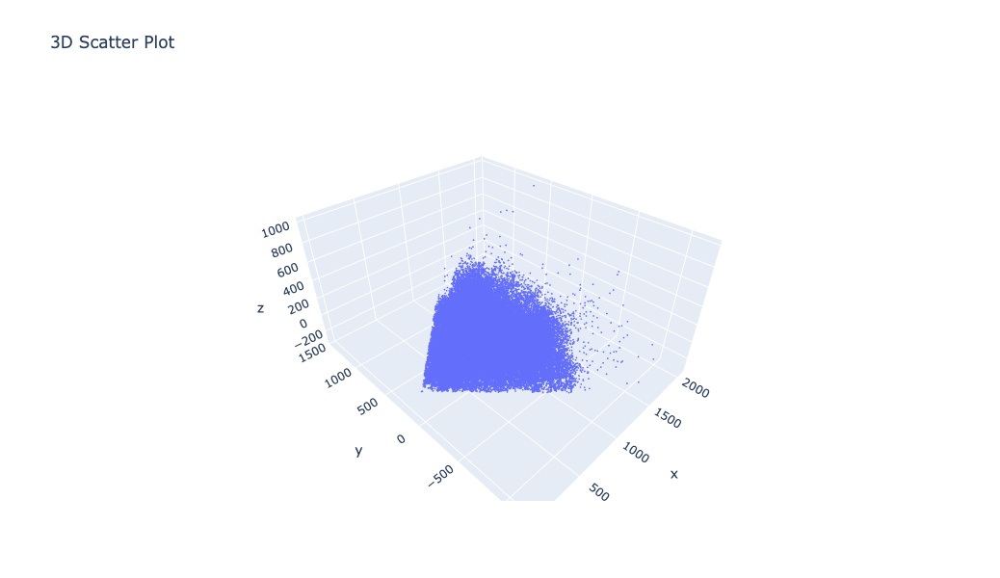

In [6]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
%matplotlib inline

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'scatter3d'}]])

# 添加数据到图形
fig.add_trace(go.Scatter3d(x=x, y=y, z=z, mode='markers', marker=dict(size=1)), row=1, col=1)


fig.update_layout(title='3D Scatter Plot', width=800, height=600)

# 设置视角
camera = dict(up=dict(x=0, y=0, z=1), center=dict(x=0, y=0, z=0), eye=dict(x=-1.25, y=-1.25, z=1.25))
fig.update_layout(scene_camera=camera)

# 显示图形
fig.show()

# Estimate spectrum from catalogue

In [7]:
# select redshift range
ZMIN = 0.2
ZMAX = 0.43

# slice the randoms
valid = (randoms['Z'] > ZMIN)&(randoms['Z'] < ZMAX)
randoms = randoms[valid]

# slice the data
valid = (data['Z'] > ZMIN)&(data['Z'] < ZMAX)
data = data[valid]

In [8]:
# Add the Completeness Weights
randoms['WEIGHT'] = 1.0
data['WEIGHT'] = data['WEIGHT_SYSTOT'] * (data['WEIGHT_NOZ'] + data['WEIGHT_CP'] - 1.0)

In [9]:
# combine the data and randoms into a single catalog
fkp = FKPCatalog(data, randoms)
mesh = fkp.to_mesh(Nmesh=256, nbar='NZ', fkp_weight='WEIGHT_FKP', comp_weight='WEIGHT', window='tsc')

In [10]:
r = ConvolvedFFTPower(mesh, poles=[0,2,4], dk=0.005, kmin=0.)

/Users/zhiyulu/Install/anaconda3/envs/nbodyccl/lib/python3.8/site-packages/nbodykit/algorithms/convpower/fkp.py:531: ComplexWarning:

Casting complex values to real discards the imaginary part

/Users/zhiyulu/Install/anaconda3/envs/nbodyccl/lib/python3.8/site-packages/nbodykit/algorithms/convpower/fkp.py:536: ComplexWarning:

Casting complex values to real discards the imaginary part



(0.01, 0.25)

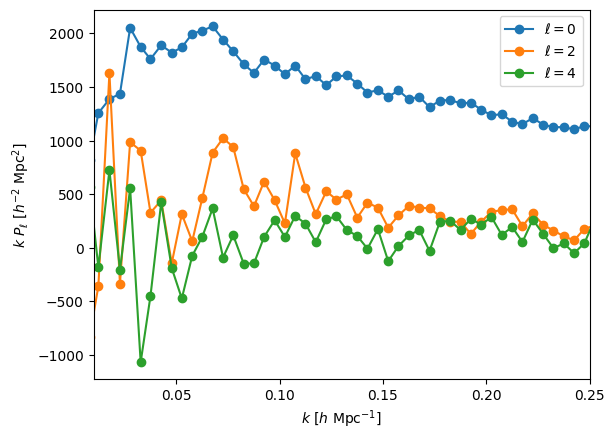

In [11]:
poles = r.poles

for ell in [0, 2, 4]:
    label = r'$\ell=%d$' % (ell)
    P = poles['power_%d' %ell].real
    if ell == 0: P = P - r.attrs['shotnoise']
    plt.plot(poles['k'], poles['k']*P,'o-' ,label=label)

# format the axes
plt.legend(loc=0)
plt.xlabel(r"$k$ [$h \ \mathrm{Mpc}^{-1}$]")
plt.ylabel(r"$k \ P_\ell$ [$h^{-2} \ \mathrm{Mpc}^2$]")
plt.xlim(0.01, 0.25)